# DAT-Projektarbeit
**Himanshu Nikam und Thomas Antony**

## Links

### Aufgabe 1 (DatenVorbereitung)
- [Aufgabe 1 A](#aufagbe-1a) <br>
- [Aufgabe 1 B](#aufagbe-1b) <br>
- [Aufgabe 1 C](#aufagbe-1c) <br>
- [Aufgabe 1 D](#aufagbe-1d) <br>
---
### Aufgabe 2  (Explorative Analyse der Stromerzeugungs- und Preisdaten)
- [Aufgabe 2 A](#aufagbe-2a) <br>
- [Aufgabe 2 B](#aufagbe-2b) <br>
- [Aufgabe 2 C](#aufagbe-2c) <br>
- [Aufgabe 2 D](#aufagbe-2d) <br>
---
### Aufgabe 3  (Weiterführende Analyse der Stromerzeugungs- und Preisdaten)
- [Aufgabe 3 A](#aufagbe-3a) <br>
- [Aufgabe 3 B](#aufagbe-3b) <br>
- [Aufgabe 3 C](#aufagbe-3c) <br>
- [Aufgabe 3 D](#aufagbe-3d) <br>
- [Aufgabe 3 E](#aufagbe-3e) <br>
- [Aufgabe 3 F](#aufagbe-3f) <br>
- [Aufgabe 3 G](#aufagbe-3g) <br>
---
### Aufgabe 4 (Untersuchung von Einflussfaktoren auf den Strompreis)
- [Aufgabe 4 A](#aufagbe-4a) <br>
- [Aufgabe 4 B](#aufagbe-4b) <br>
- [Aufgabe 4 C](#aufagbe-4c) <br>
---
### Aufgabe 5 (Modellbildung)
- [Aufgabe 5 A](#aufagbe-5a) <br>
- [Aufgabe 5 B](#aufagbe-5b) <br>
- [Aufgabe 5 C](#aufgabe-5c)

---
### Aufgabe 6 (Analyse von Stromtarif-Angeboten für Endkunden) 
- [Aufgabe 6 A](#aufgabe-6a) <br>
- [Aufgabe 6 B](#aufgabe-6b) <br>
- [Aufgabe 6 C](#aufgabe-6c) <br>
- [Aufgabe 6 D](#aufgabe-6d) <br>
- [Aufgabe 6 E](#aufgabe-6e) <br>
- [Aufgabe 6 F](#aufgabe-6f) <br>
- [Aufgabe 6 G](#aufgabe-6g) <br>
- [Aufgabe 6 H](#aufgabe-6h) <br>
- [Aufgabe 6 I](#aufgabe-6i) 

---


# Aufgabe 1
**a) Lesen Sie die CSV-Dateien,die die Stromerzeugungsdaten und Börsenstrompreise enthalten ein und führen Sie sie in einem DataFrame namens `df_hourly` zusammen.**

In [77]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import openmeteo_requests
import requests_cache
from retry_requests import retry
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression

<a id="aufgabe-1a"></a>
**Quelle (stackoverflow) : https://stackoverflow.com/q/20906474/24979304**

In [78]:
path = 'DAT-WS2425-Projektarbeit\DAT-WS2425-Projektarbeit\Daten\Strompreisdaten'
extension = '.csv'
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
files = [file for file in os.listdir(path) if file.endswith(extension)]

dfs = []
filecounter =0
for file in files:
    df = pd.read_csv(os.path.join(path, file))
    dfs.append(df)
    filecounter += 1
    
print("total files: ", filecounter)
#TODO : Refactor df to df_hourly throughout the code
df_hourly = pd.concat(dfs, ignore_index=True)

total files:  260


**b) Passen Sie die dtypes der Spalten von `df_hourly` geeignet an. Überführen Sie insbesondere das Datum in ein DateTime-Format. Entfernen Sie alle Datensätze, die sich nicht auf
 den Betrachtungszeitraum 2020-2024 beziehen.**
 <a id="aufagbe-1b"></a>

In [79]:
df_hourly['Datum (MEZ)'] = pd.to_datetime(df_hourly['Datum (MEZ)'])
df_hourly['Datum (MESZ)'] = pd.to_datetime(df_hourly['Datum (MESZ)'])
print(len(df_hourly['Datum (MESZ)']))

43896


In [80]:
df_hourly = df_hourly.drop(df_hourly[df_hourly['Datum (MEZ)']<'2020-01-01'].index)

**c) Beurteilen Sie die Datenqualität des Datensatzes und führen Sie, sofern aus Ihrer Sicht notwendig, geeignete Datenbereinigungsschritte durch.**
<a id="aufagbe-1c"></a>

In [81]:
# Separating and Creating new columns for Date and Time from Datum (MEZ) and Datum (MESZ)
df_hourly['Datum'] = df_hourly['Datum (MEZ)'].dt.date
df_hourly['Zeit'] = df_hourly['Datum (MEZ)'].dt.time
df_hourly['Datum'] =df_hourly['Datum'].fillna(df_hourly['Datum (MESZ)'].dt.date)
df_hourly['Zeit'] =df_hourly['Zeit'].fillna(df_hourly['Datum (MESZ)'].dt.time)
cols = df.columns.tolist()
print(cols)

['Datum (MEZ)', 'Leistung nicht erneuerbar (MW)', 'Leistung erneuerbar (MW)', 'Day Ahead Auktion Preis (EUR/MWh)']


In [82]:
cols = ['Datum', 'Zeit','Datum (MEZ)', 'Leistung nicht erneuerbar (MW)', 'Leistung erneuerbar (MW)', 'Day Ahead Auktion Preis (EUR/MWh)', 'Datum (MESZ)']
df_hourly = df_hourly[cols]
#Dropping MESZ and MEZ Columns
df_hourly = df_hourly.drop(columns=['Datum (MEZ)', 'Datum (MESZ)'])
df_hourly = df_hourly.reset_index(drop=True)
df_hourly

,Datum,Zeit,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh)
0,2020-01-01,00:00:00,18754.70,13961.99,41.88
1,2020-01-01,01:00:00,18337.54,14242.17,38.60
2,2020-01-01,02:00:00,18122.83,14584.20,36.55
3,2020-01-01,03:00:00,18323.93,14746.24,32.32
4,2020-01-01,04:00:00,18327.59,14924.48,30.85
...,...,...,...,...,...
43843,2024-12-31,19:00:00,21383.15,38916.54,67.77
43844,2024-12-31,20:00:00,18556.76,40027.68,35.56
43845,2024-12-31,21:00:00,15780.62,40653.76,15.70
43846,2024-12-31,22:00:00,14930.74,40116.86,9.06


**d) Erzeugen Sie aus `df_hourly` einen weiteren DataFrame namens `df_daily`, der in jeder
 Zeile die erzeugte elektrische Energie mit erneuerbaren und nicht erneuerbaren Energie
trägern sowie den an diesem Tag durchschnittlich gemessenen Börsenstrompreis enthält.**
<a id="aufagbe-1d"></a>

In [83]:
# New df_daily with sum of Leistung and average of Auktion preis for every day
df_daily = df_hourly.groupby(['Datum']).agg({'Leistung nicht erneuerbar (MW)': 'sum', 'Leistung erneuerbar (MW)': 'sum', 'Day Ahead Auktion Preis (EUR/MWh)' : 'mean'}).reset_index()
df_daily

,Datum,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh)
0,2020-01-01,468837.03,441093.57,34.964167
1,2020-01-02,505002.46,605620.76,38.869167
2,2020-01-03,427798.33,968577.88,26.111250
3,2020-01-04,411321.40,987041.46,20.322917
4,2020-01-05,508187.80,514534.00,35.552500
...,...,...,...,...
1822,2024-12-27,708574.01,268571.36,121.706250
1823,2024-12-28,700316.27,275162.43,122.638333
1824,2024-12-29,615408.50,547203.48,105.280417
1825,2024-12-30,607675.26,783569.49,78.155833


# Aufagbe 2

**a) An welchen 10 Tagen im Betrachtungszeitrum wurde am meisten Strom aus erneuerbaren Energieträgern erzeugt?**
<a id="aufagbe-2a"></a>

In [84]:
df_daily[['Datum', 'Leistung erneuerbar (MW)']].sort_values('Leistung erneuerbar (MW)', ascending=False).head(10)

,Datum,Leistung erneuerbar (MW)
1497,2024-02-06,1380463.41
1496,2024-02-05,1358926.97
1484,2024-01-24,1316391.11
1450,2023-12-21,1308032.94
1451,2023-12-22,1289984.86
827,2022-04-07,1274027.01
778,2022-02-17,1271433.30
1731,2024-09-27,1269933.18
1458,2023-12-29,1261365.77
41,2020-02-11,1257586.20


**b) An welchem Tag im Betrachtungszeitraum wurde der höchste Bösenstrompreis verzeichnet und wie hoch war er? An welchem Tag wurde der geringste Preis verzeichnet und wie hoch war er?**
<a id="aufagbe-2b"></a>

In [85]:
df_daily[df_daily['Day Ahead Auktion Preis (EUR/MWh)'] == df_daily['Day Ahead Auktion Preis (EUR/MWh)'].max()][['Datum', 'Day Ahead Auktion Preis (EUR/MWh)']]

,Datum,Day Ahead Auktion Preis (EUR/MWh)
968,2022-08-26,699.441667


In [86]:
df_daily[df_daily['Day Ahead Auktion Preis (EUR/MWh)'] == df_daily['Day Ahead Auktion Preis (EUR/MWh)'].min()][['Datum', 'Day Ahead Auktion Preis (EUR/MWh)']]

,Datum,Day Ahead Auktion Preis (EUR/MWh)
1278,2023-07-02,-53.870833


**c) Wie viele Tage gab es im Betrachtungszeitraum 2020-2024, an denen ein negativer Börsenstrompreis aufgetreten ist?**
<a id="aufagbe-2b"></a>

In [87]:
print(len(df_daily[df_daily['Day Ahead Auktion Preis (EUR/MWh)'] < 0].groupby(['Datum'])))

13


**d) Wie viel Strom wurde pro Jahr mit erneuerbaren und mit nicht erneuerbaren Energieträgernerzeugt?**
<a id="aufagbe-2d"></a>

In [88]:
df2 = df_hourly

In [89]:
df2['Jahr'] = pd.DatetimeIndex(df2['Datum']).year
df_yearly = df2.groupby(['Jahr']).agg({'Leistung nicht erneuerbar (MW)':'sum', 'Leistung erneuerbar (MW)':'sum'}).reset_index()
df_yearly

,Jahr,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW)
0,2020,1.870113e+08,2.392726e+08
1,2021,2.093507e+08,2.220113e+08
2,2022,2.168424e+08,2.380835e+08
3,2023,1.653949e+08,2.534251e+08
4,2024,1.532793e+08,2.599273e+08


# Aufgabe 3
**a) Visualisieren Sie in geeigneten Diagrammen die Verteilung der Börsenstrompreise (insgesamt und pro Jahr).**
<a id="aufagbe-3a"></a>

<Axes: title={'center': 'Verteilung der Börsenstrompreise (pro jahr)'}, xlabel='Jahr', ylabel='Day Ahead Auktion Preis (EUR/MWh)'>

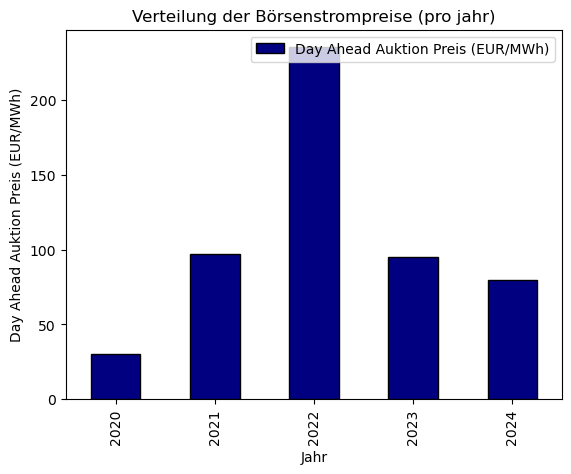

In [90]:
df_yearly = df2.groupby(['Jahr']).agg({'Leistung nicht erneuerbar (MW)':'sum', 'Leistung erneuerbar (MW)':'sum', 'Day Ahead Auktion Preis (EUR/MWh)':'mean'}).reset_index()
df_yearly.plot.bar(x='Jahr', y='Day Ahead Auktion Preis (EUR/MWh)', colormap='jet', edgecolor='k', title='Verteilung der Börsenstrompreise (pro jahr)', ylabel='Day Ahead Auktion Preis (EUR/MWh)')

<Axes: title={'center': 'Verteilung der Börsenstrompreise (insgesamt)'}, xlabel='Datum', ylabel='Day Ahead Auktion Preis (MWh)'>

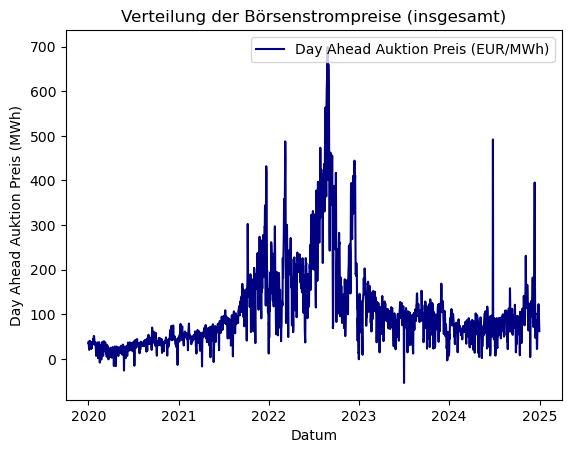

In [91]:
df_daily.plot(x='Datum', y='Day Ahead Auktion Preis (EUR/MWh)', colormap='jet', title='Verteilung der Börsenstrompreise (insgesamt)', ylabel='Day Ahead Auktion Preis (MWh)')

**b) Berechnen Sie bezogen auf die einzelnen Jahre des Betrachtungszeitraums verschiedene statistische Kenngrößen für den Börsenstrompreis.**
<a id="aufagbe-3b"></a>

In [92]:
df_year_2020 = df2[df2['Jahr'] == 2020].reset_index()
df_year_2021 = df2[df2['Jahr'] == 2021].reset_index()
df_year_2022 = df2[df2['Jahr'] == 2022].reset_index()
df_year_2023 = df2[df2['Jahr'] == 2023].reset_index()
df_year_2024 = df2[df2['Jahr'] == 2024].reset_index()
print(df_year_2020.columns.tolist())

['index', 'Datum', 'Zeit', 'Leistung nicht erneuerbar (MW)', 'Leistung erneuerbar (MW)', 'Day Ahead Auktion Preis (EUR/MWh)', 'Jahr']


In [93]:
sk_2020=df_year_2020.groupby('Jahr')[['Day Ahead Auktion Preis (EUR/MWh)']].agg(['mean', 'std', 'min', 'max'])
sk_2021=df_year_2021.groupby('Jahr')[['Day Ahead Auktion Preis (EUR/MWh)']].agg(['mean', 'std', 'min', 'max'])
sk_2022=df_year_2022.groupby('Jahr')[['Day Ahead Auktion Preis (EUR/MWh)']].agg(['mean', 'std', 'min', 'max'])
sk_2023=df_year_2023.groupby('Jahr')[['Day Ahead Auktion Preis (EUR/MWh)']].agg(['mean', 'std', 'min', 'max'])
sk_2024=df_year_2024.groupby('Jahr')[['Day Ahead Auktion Preis (EUR/MWh)']].agg(['mean', 'std', 'min', 'max'])

In [94]:
kenngroesse_df = pd.concat([sk_2020, sk_2021, sk_2022, sk_2023, sk_2024]).reset_index()
cols = ['Jahr','Mean', 'Standard deviation', 'Minimum', 'Maximum']
kenngroesse_df.columns = cols
kenngroesse_df

,Jahr,Mean,Standard deviation,Minimum,Maximum
0,2020,30.470716,17.500845,-83.94,200.04
1,2021,96.849918,73.680947,-69.00,620.00
2,2022,235.446143,142.809409,-19.04,871.00
3,2023,95.175452,47.584215,-500.00,524.27
4,2024,79.574932,64.494957,-135.45,2325.83


**c) Visualisieren Sie in einem Säulendiagramm die mittleren Börsenstrompreise pro Monat des Betrachtungszeitraums.**
<a id="aufagbe-3c"></a>

In [95]:
df_year_2020['Monat']= pd.DatetimeIndex(df_year_2020['Datum']).month
df_year_2021['Monat']= pd.DatetimeIndex(df_year_2021['Datum']).month
df_year_2022['Monat']= pd.DatetimeIndex(df_year_2022['Datum']).month
df_year_2023['Monat']= pd.DatetimeIndex(df_year_2023['Datum']).month
df_year_2024['Monat']= pd.DatetimeIndex(df_year_2024['Datum']).month

In [96]:
mean_month_preis_2020= df_year_2020.groupby('Monat')['Day Ahead Auktion Preis (EUR/MWh)'].mean()
mean_month_preis_2021= df_year_2021.groupby('Monat')['Day Ahead Auktion Preis (EUR/MWh)'].mean()
mean_month_preis_2022= df_year_2022.groupby('Monat')['Day Ahead Auktion Preis (EUR/MWh)'].mean()
mean_month_preis_2023= df_year_2023.groupby('Monat')['Day Ahead Auktion Preis (EUR/MWh)'].mean()
mean_month_preis_2024= df_year_2024.groupby('Monat')['Day Ahead Auktion Preis (EUR/MWh)'].mean()

In [97]:
df_monthly_preis=pd.DataFrame(dict(s1 = mean_month_preis_2020, s2 = mean_month_preis_2021, s3=mean_month_preis_2022, s4=mean_month_preis_2023, s5=mean_month_preis_2024))
cols = ['2020', '2021', '2022', '2023', '2024']
df_monthly_preis.columns = cols
df_monthly_preis

,2020,2021,2022,2023,2024
Monat,,,,,
1,35.034906,52.806223,167.726573,117.829315,76.571142
2,21.919009,48.704940,128.802679,128.311845,61.335848
3,22.485828,47.164832,252.006851,102.521454,64.701992
4,17.093139,53.613139,165.731903,100.744000,62.360819
5,17.596505,53.348938,177.476949,81.715390,67.210013
6,26.184889,74.079958,218.033236,94.756111,85.855083
7,30.062863,81.369247,315.000995,77.606156,67.697030
8,34.863952,82.696882,465.183508,94.321882,82.047177
9,43.690194,128.372306,346.115125,100.723486,78.309972


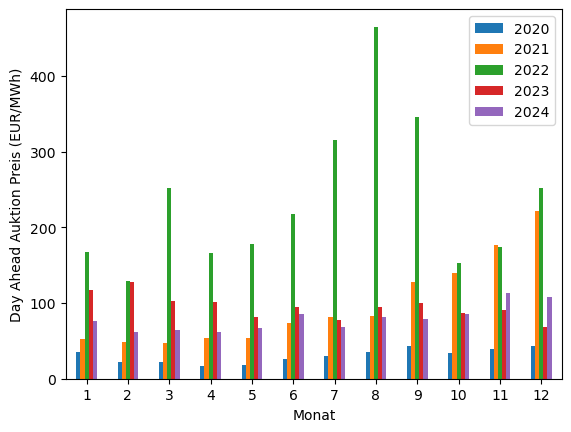

In [98]:
ax = df_monthly_preis.plot.bar(rot=0, ylabel = "Day Ahead Auktion Preis (EUR/MWh)")

**d) Visualisieren Sie die stündlichen Börsenstrompreise in einem interaktiven Liniendiagramm in Plotly. Versehen Sie dieses mit einem Range-Selektor und einem Range-Slider. Analysieren Sie auf der Basis der Ergebnisse der Teilaufgaben a)-d) die wesentlichen Entwicklungen und Trends der Börsenstrompreise im Betrachtungszeitraum 2020-2024.**
<a id="aufagbe-3d"></a>

In [99]:
import plotly.graph_objs as go
import numpy as np

trace = go.Scatter(
    x=df_hourly['Datum'],
    y=df_hourly['Day Ahead Auktion Preis (EUR/MWh)']
)

layout = dict(
    title='Time series with range slider and selectors',
    xaxis=dict(
        title = dict(
            text = 'Datum'
        ),
        rangeselector=dict(
            buttons=list([
                dict(count=5,
                     label='5 Tage',
                     step='day',
                     stepmode='backward'),
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(count=1,
                    label='YTD',
                    step='year',
                    stepmode='todate'),
                dict(count=1,
                    label='1y',
                    step='year',
                    stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
    #Hinweis: Upper Limit of 1000 shows incorrect values of Outliers
    yaxis=dict(
        range=[-600,1000],
        type='linear',
    title=dict(
        text='Day Ahead Auktion Preis (EUR/MWh)',
        )
    )

)

data = [trace]

fig= go.Figure(data=data, layout=layout)
fig.show()

In [100]:
aufgabe_3d=df_hourly.groupby(['Datum']).agg({'Leistung erneuerbar (MW)':'mean'}).reset_index()
aufgabe_3d

,Datum,Leistung erneuerbar (MW)
0,2020-01-01,18378.898750
1,2020-01-02,25234.198333
2,2020-01-03,40357.411667
3,2020-01-04,41126.727500
4,2020-01-05,21438.916667
...,...,...
1822,2024-12-27,11190.473333
1823,2024-12-28,11465.101250
1824,2024-12-29,22800.145000
1825,2024-12-30,32648.728750


**e) Berechnen und visualisieren Sie die im Mittel mit erneuerbaren Energieträgern erzeugte elektrische Energie im Tagesverlauf, indem Sie sie auf die vollen Stunden eines Tages aggregieren**
<a id="aufagbe-3e"></a>

In [101]:
trace = go.Scatter(
    x=aufgabe_3d['Datum'],
    y=aufgabe_3d['Leistung erneuerbar (MW)']
)

layout = dict(
    title='Time series with range slider and selectors',
    xaxis=dict(
        title = dict(
            text = 'Datum'
        ),
        rangeselector=dict(
            buttons=list([                
                dict(count=1,
                     label='1 Tag',
                     step='day',
                     stepmode='backward'),
                dict(count=7,
                     label='1 Woche',
                     step='day',
                     stepmode='backward'),
                dict(count=1,
                     label='1 Monat',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6 Monate',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
    
    yaxis=dict(
        range=[6900,72000],
        type='linear',
        title=dict(
        text='Leistung Erneuerbar (MW)',
        )
    
    )
            
    
    

)

data = [trace]

fig= go.Figure(data=data, layout=layout)
fig.show()

**f) Visualisieren Sie in einem geeigneten Diagramm die pro Tag mit erneuerbaren Energie trägern erzeugte elektrische Energie und analysieren Sie diese. Gehen Sie dabei sowohl auf einzelne auffällige Tage als auch auf übergeordnete Entwicklungen und Trends ein.**
<a id="aufagbe-3f"></a>

In [102]:
trace = go.Scatter(
    x=df_daily['Datum'],
    y=df_daily['Leistung erneuerbar (MW)'],
    mode='markers',
    marker=dict(
        size=7,
        color = df_daily['Leistung erneuerbar (MW)'], 
        colorscale='Viridis',
        showscale=True
    )
)

layout = dict(
    title='Time series with range slider and selectors',
    xaxis=dict(
        title = dict(
            text='Datum'
        ),
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1 Tag',
                     step='day',
                     stepmode='backward'),
                
                dict(count=7,
                     label='1 Woche',
                     step='day',
                     stepmode='backward'),
                
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                
                dict(count=1,
                    label='1y',
                    step='year',
                    stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
    yaxis=dict(
        title = dict(
            text = 'Leistung erneuerbar (MW)',
        )
    )
)

data = [trace]

fig= go.Figure(data=data, layout=layout)
fig.show()

**g) Visualisieren Sie auf geeignete Weise die Zusammensetzung des erzeugten Stroms (erneuerbar vs. nicht erneuerbar) im Zeitverlauf und analyisieren Sie diese.**
<a id="aufagbe-3g"></a>

In [103]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_hourly['Datum'], y=df_hourly['Leistung erneuerbar (MW)'], name='Leistung erneuerbar (MW)'))
fig.add_trace(go.Scatter(x=df_hourly['Datum'], y=df_hourly['Leistung nicht erneuerbar (MW)'],name='Leistung nicht erneuerbar (MW)'))
fig.update_layout(
    dict(
    title='Time series with range slider and selectors',
    xaxis=dict(
        title = dict(
            text = 'Datum'
        ),
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1 Tag',
                     step='day',
                     stepmode='backward'),
                
                dict(count=7,
                     label='1 Woche',
                     step='day',
                     stepmode='backward'),
                
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                
                dict(count=1,
                    label='1y',
                    step='year',
                    stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
        yaxis=dict(
            title=dict(
    text='Erzeugte Energie (MW)',
    )
    
)
    )
)
fig.show()

# Aufgabe 4 (Untersuchung von Einflussfaktoren auf den Strompreis)

**Verschaffen Sie sich zunächst anhand der Online-Dokumentation unter https://open-meteo.com/en/docs/historical-weather-api  einen Überblick über die `historical-weather-api` von `open-meteo`.**

**a) Implementieren Sie eine Funktion namens `getweatherdata(lat, lon, start date, end date)`,
 die die (tagesbezogenen) Wetterdaten für die durch `(lon,lat)` gegebene Geo-Position
 im Zeitraum zwischen `start date` und `end date` von der `open-meteo-API` bezieht
 und das Ergebnis als DataFrame zurückgibt. Verwenden Sie für den Zugriff auf die API das
 Paket `requests`. Jede Zeile des DataFrames soll die Wetterdaten zu einem Tag enthalten.
 Wenden Sie diese Funktion anschließend an, um historische Wetterdaten der Jahre 2020
2024 für die Stadt Amberg zu beziehen. Reichern Sie den DataFrame `df daily` um diese
 Wetterdaten an. Speichern Sie den resultierenden Datensatz in einer CSV-Datei namens
 `daily.csv` und laden Sie diese mit Ihrer Abgabe auf Moodle hoch.**
 <a id="aufagbe-4a"></a>

In [104]:
def get_weather_data(lat, lon, start_date, end_date):
    
    cache_session = requests_cache.CachedSession('.cache', expire_after = 3600)
    retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
    openmeteo = openmeteo_requests.Client(session = retry_session)
    
    
    url = "https://archive-api.open-meteo.com/v1/archive"
    params = {
        "latitude": lat,
        "longitude": lon,
        "start_date": start_date,
        "end_date": end_date,
        "hourly": ["temperature_2m", "relative_humidity_2m", "precipitation", "rain", "snowfall"]
    }
    responses = openmeteo.weather_api(url, params=params)
    
    
    response = responses[0]
    print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
    print(f"Elevation {response.Elevation()} m asl")
    print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
    print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")
    
    hourly = response.Hourly()
    hourly_temperature_2m = hourly.Variables(0).ValuesAsNumpy()
    hourly_relative_humidity_2m = hourly.Variables(1).ValuesAsNumpy()
    hourly_precipitation = hourly.Variables(2).ValuesAsNumpy()
    hourly_rain = hourly.Variables(3).ValuesAsNumpy()
    hourly_snowfall = hourly.Variables(4).ValuesAsNumpy()
    
    hourly_data = {"date": pd.date_range(
        start = pd.to_datetime(hourly.Time(), unit = "s", utc = True),
        end = pd.to_datetime(hourly.TimeEnd(), unit = "s", utc = True),
        freq = pd.Timedelta(seconds = hourly.Interval()),
        inclusive = "left"
    )}
    hourly_data["temperature_2m"] = hourly_temperature_2m
    hourly_data["relative_humidity_2m"] = hourly_relative_humidity_2m
    hourly_data["precipitation"] = hourly_precipitation
    hourly_data["rain"] = hourly_rain
    hourly_data["Snowfall"] = hourly_snowfall
    
    hourly_dataframe = pd.DataFrame(data = hourly_data)
    return hourly_dataframe

In [105]:
df_amberg=get_weather_data(49.4403,11.8633,"2020-01-01","2024-12-31" )

Coordinates 49.45518112182617°N 11.92771053314209°E
Elevation 374.0 m asl
Timezone None None
Timezone difference to GMT+0 0 s


In [106]:
df_amberg['Datum'] = df_amberg['date'].dt.date  
df_amberg['Zeit'] = df_amberg['date'].dt.time
df_amberg=df_amberg.drop(columns=['date'])
cols = ['Datum', 'Zeit', 'temperature_2m','relative_humidity_2m','precipitation', 'rain','Snowfall']
df_amberg = df_amberg[cols]
df_amberg = df_amberg.reset_index(drop = True)
df_amberg_daily=df_amberg.groupby(['Datum'])[['temperature_2m','relative_humidity_2m','precipitation','rain','Snowfall']].agg('mean').reset_index()
df_amberg_daily

,Datum,temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall
0,2020-01-01,-2.458000,91.965508,0.0000,0.000000,0.000000
1,2020-01-02,-1.862167,87.584938,0.0000,0.000000,0.000000
2,2020-01-03,2.046167,87.802574,0.0125,0.012500,0.000000
3,2020-01-04,3.294083,91.306740,0.1500,0.141667,0.005833
4,2020-01-05,1.048250,86.753815,0.0000,0.000000,0.000000
...,...,...,...,...,...,...
1822,2024-12-27,-1.191333,74.126778,0.0000,0.000000,0.000000
1823,2024-12-28,-2.739250,86.747185,0.0000,0.000000,0.000000
1824,2024-12-29,-2.041333,90.377678,0.0000,0.000000,0.000000
1825,2024-12-30,-2.162167,92.474068,0.0000,0.000000,0.000000


In [107]:
df_daily= df_daily.merge(df_amberg_daily,on='Datum', how='right')
df_daily

,Datum,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall
0,2020-01-01,468837.03,441093.57,34.964167,-2.458000,91.965508,0.0000,0.000000,0.000000
1,2020-01-02,505002.46,605620.76,38.869167,-1.862167,87.584938,0.0000,0.000000,0.000000
2,2020-01-03,427798.33,968577.88,26.111250,2.046167,87.802574,0.0125,0.012500,0.000000
3,2020-01-04,411321.40,987041.46,20.322917,3.294083,91.306740,0.1500,0.141667,0.005833
4,2020-01-05,508187.80,514534.00,35.552500,1.048250,86.753815,0.0000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
1822,2024-12-27,708574.01,268571.36,121.706250,-1.191333,74.126778,0.0000,0.000000,0.000000
1823,2024-12-28,700316.27,275162.43,122.638333,-2.739250,86.747185,0.0000,0.000000,0.000000
1824,2024-12-29,615408.50,547203.48,105.280417,-2.041333,90.377678,0.0000,0.000000,0.000000
1825,2024-12-30,607675.26,783569.49,78.155833,-2.162167,92.474068,0.0000,0.000000,0.000000


In [108]:
df_daily.to_csv('daily.csv')

**b) Reichern Sie den DataFrame df daily weiterhin um Börsenschlusskurse für Kohle und Erdgas an, die in den CSV-Dateien gaspreise.csv bzw.kohlepreise.csv gegeben sind. Visualisieren und untersuchen Sie auf geeignete Weise die Zusammenhänge (paarweise) zwischen Börsenstrompreis, Gaspreis, Kohlepreis und erneuerbarer Energieerzeugung.**
<a id="aufagbe-4b"></a>

In [109]:
df_daily['Datum']= pd.to_datetime(df_daily['Datum'])
gaspreise_df = pd.read_csv("DAT-WS2425-Projektarbeit\DAT-WS2425-Projektarbeit\Daten\gaspreise.csv")
gaspreise_df['Datum'] = pd.to_datetime(gaspreise_df['Datum']) 
df_daily= df_daily.merge(gaspreise_df,on='Datum', how='left')

In [110]:
kohlenpreise_df = pd.read_csv("DAT-WS2425-Projektarbeit\DAT-WS2425-Projektarbeit\Daten\kohlepreise.csv")
kohlenpreise_df['Datum'] = pd.to_datetime(kohlenpreise_df['Datum'])
df_daily= df_daily.merge(kohlenpreise_df,on='Datum', how='left')
df_daily['Gaspreise Schlusskurs']= df_daily['Schlusskurs_x']
df_daily['Kohlepreise Schlusskurs'] = df_daily['Schlusskurs_y']
df_daily= df_daily.drop(columns=['Schlusskurs_x','Schlusskurs_y'])
df_daily

,Datum,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall,Gaspreise Schlusskurs,Kohlepreise Schlusskurs
0,2020-01-01,468837.03,441093.57,34.964167,-2.458000,91.965508,0.0000,0.000000,0.000000,NaN,NaN
1,2020-01-02,505002.46,605620.76,38.869167,-1.862167,87.584938,0.0000,0.000000,0.000000,1.90,40.77
2,2020-01-03,427798.33,968577.88,26.111250,2.046167,87.802574,0.0125,0.012500,0.000000,1.91,40.82
3,2020-01-04,411321.40,987041.46,20.322917,3.294083,91.306740,0.1500,0.141667,0.005833,NaN,NaN
4,2020-01-05,508187.80,514534.00,35.552500,1.048250,86.753815,0.0000,0.000000,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1822,2024-12-27,708574.01,268571.36,121.706250,-1.191333,74.126778,0.0000,0.000000,0.000000,3.37,107.66
1823,2024-12-28,700316.27,275162.43,122.638333,-2.739250,86.747185,0.0000,0.000000,0.000000,NaN,NaN
1824,2024-12-29,615408.50,547203.48,105.280417,-2.041333,90.377678,0.0000,0.000000,0.000000,NaN,NaN
1825,2024-12-30,607675.26,783569.49,78.155833,-2.162167,92.474068,0.0000,0.000000,0.000000,3.79,108.26


In [111]:

#  WICHTIG : Gaspreise Schlusskurs ist durch 100 multipliziert und Leistung erneuerbare (MW) ist durch 1000 geteilt für bessere Visualisierung

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_daily['Datum'], y=df_daily['Gaspreise Schlusskurs']*100, name='Gaspreise (RELATIV) ', visible=True))
fig.add_trace(go.Scatter(x=df_daily['Datum'], y=df_daily['Kohlepreise Schlusskurs'],name='Kohlepreise', visible=True))
fig.add_trace(go.Scatter(x=df_daily['Datum'], y= df_daily['Day Ahead Auktion Preis (EUR/MWh)'], name='Day Ahead Auktion Preis', visible=True))
fig.add_trace(go.Scatter(x=df_daily['Datum'], y= df_daily['Leistung erneuerbar (MW)']/1000, name='Leistung erneuerbar (MW) (RELATIV)', visible=False))
updatemenus=[
    {
        "buttons":[
            {
                "label": "Leistung Eneuerbar (MW) (RELATIV) : AN",
                "method":"update",
                "args":[
                    {"visible": [True,True, True, True]}

                ]
            },
            {
                "label": "Leistung Eneuerbar (MW) (RELATIV) : AUS",
                "method":"update",
                "args":[
                    {"visible": [True,True, True, False]}

                ]
            }
        ],
        "direction": "down",
        "showactive": True
    }
]
fig.update_layout(
    dict(
    updatemenus=updatemenus,
    title='Time series with range slider and selectors',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1 Tag',
                     step='day',
                     stepmode='backward'),
                
                dict(count=7,
                     label='1 Woche',
                     step='day',
                     stepmode='backward'),
                
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                
                dict(count=1,
                    label='1y',
                    step='year',
                    stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    ),
)
)
fig.update_traces(connectgaps=True)
fig.show()

**c) Führen Sie eine Korrelationsanalyse für alle Variablen des DataFrames `df_daily` durch. Erzeugen Sie dazu eine interaktive Correlation HeatMap in Plotly.**
<a id="aufagbe-4c"></a>

In [112]:
sample_df = df_daily
sample_df = sample_df.drop(columns=['Datum']).reset_index(drop=True)
sample_df

,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall,Gaspreise Schlusskurs,Kohlepreise Schlusskurs
0,468837.03,441093.57,34.964167,-2.458000,91.965508,0.0000,0.000000,0.000000,NaN,NaN
1,505002.46,605620.76,38.869167,-1.862167,87.584938,0.0000,0.000000,0.000000,1.90,40.77
2,427798.33,968577.88,26.111250,2.046167,87.802574,0.0125,0.012500,0.000000,1.91,40.82
3,411321.40,987041.46,20.322917,3.294083,91.306740,0.1500,0.141667,0.005833,NaN,NaN
4,508187.80,514534.00,35.552500,1.048250,86.753815,0.0000,0.000000,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1822,708574.01,268571.36,121.706250,-1.191333,74.126778,0.0000,0.000000,0.000000,3.37,107.66
1823,700316.27,275162.43,122.638333,-2.739250,86.747185,0.0000,0.000000,0.000000,NaN,NaN
1824,615408.50,547203.48,105.280417,-2.041333,90.377678,0.0000,0.000000,0.000000,NaN,NaN
1825,607675.26,783569.49,78.155833,-2.162167,92.474068,0.0000,0.000000,0.000000,3.79,108.26


In [113]:
correlation_analyse = sample_df.corr()
display(correlation_analyse)
fig = go.Figure(data=go.Heatmap(z=correlation_analyse.values, x=correlation_analyse.columns, y= correlation_analyse.columns, colorscale='Viridis', text = correlation_analyse.values, texttemplate='%{text:.2f}'))
fig.update_layout(width=1000, height=750)
fig.show()


,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall,Gaspreise Schlusskurs,Kohlepreise Schlusskurs
Leistung nicht erneuerbar (MW),1.000000,-0.551624,0.441652,-0.511113,0.369664,-0.091808,-0.140484,0.165352,0.215006,0.169816
Leistung erneuerbar (MW),-0.551624,1.000000,-0.350002,-0.044636,-0.105244,0.075450,0.074671,0.014549,-0.102955,-0.084969
Day Ahead Auktion Preis (EUR/MWh),0.441652,-0.350002,1.000000,0.044341,-0.016345,-0.052851,-0.056524,0.005398,0.786393,0.818224
temperature_2m,-0.511113,-0.044636,0.044341,1.000000,-0.495153,0.031393,0.099414,-0.245986,0.134288,0.143007
relative_humidity_2m,0.369664,-0.105244,-0.016345,-0.495153,1.000000,0.312001,0.284731,0.148316,-0.058602,-0.133078
precipitation,-0.091808,0.075450,-0.052851,0.031393,0.312001,1.000000,0.965418,0.280524,-0.044726,-0.062978
rain,-0.140484,0.074671,-0.056524,0.099414,0.284731,0.965418,1.000000,0.020591,-0.037367,-0.051775
Snowfall,0.165352,0.014549,0.005398,-0.245986,0.148316,0.280524,0.020591,1.000000,-0.033515,-0.050244
Gaspreise Schlusskurs,0.215006,-0.102955,0.786393,0.134288,-0.058602,-0.044726,-0.037367,-0.033515,1.000000,0.908113
Kohlepreise Schlusskurs,0.169816,-0.084969,0.818224,0.143007,-0.133078,-0.062978,-0.051775,-0.050244,0.908113,1.000000


# Aufgabe  5 
**a) Erstellen Sie unter Verwendung der Bibliothek Scikit-learn ein lineares Regressionsmodell zur Modellierung des mittleren Borsenstrompreises pro Tag in Abhängigkeit verschiedener Eingangsgroßen. Selektieren Sie basierend auf der vorherigen Aufgabe zunächst ¨
geeignete Merkmale als Eingangsgroßen. Teilen Sie die Daten anschließend in eine Trainings- ¨
und eine Testdatenmenge und erstellen Sie ein lineares Regressionsmodell auf dem Trainingsdatensatz. Wie lautet der ermittelte funktionale Zusammenhang zwischen den Inputund der Outputgroßen des Modells?**
<a id="aufagbe-5a"></a>



In [114]:
print(df_daily.isna().sum())

Datum                                  0
Leistung nicht erneuerbar (MW)         0
Leistung erneuerbar (MW)               0
Day Ahead Auktion Preis (EUR/MWh)      0
temperature_2m                         0
relative_humidity_2m                   0
precipitation                          0
rain                                   0
Snowfall                               0
Gaspreise Schlusskurs                573
Kohlepreise Schlusskurs              569
dtype: int64


Hier werden alle NaN werte durch den mittlwerte des entsprechendes Monats ersetzt: <br>
**Quelle (ChatGPT) :https://chatgpt.com/share/67952d82-a010-800e-b6bd-13c623ca5374**

In [115]:
# Filling missing values for 'Gaspreise Schlusskurs'
monthly_gas_mean = df_daily.groupby(df_daily['Datum'].dt.month)['Gaspreise Schlusskurs'].transform('mean')
df_daily['Gaspreise Schlusskurs'] = df_daily['Gaspreise Schlusskurs'].fillna(monthly_gas_mean)

# Filling missing values for 'Kohlepreise Schlusskurs'
monthly_coal_mean = df_daily.groupby(df_daily['Datum'].dt.month)['Kohlepreise Schlusskurs'].transform('mean')
df_daily['Kohlepreise Schlusskurs'] = df_daily['Kohlepreise Schlusskurs'].fillna(monthly_coal_mean)
df_daily

,Datum,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall,Gaspreise Schlusskurs,Kohlepreise Schlusskurs
0,2020-01-01,468837.03,441093.57,34.964167,-2.458000,91.965508,0.0000,0.000000,0.000000,2.696863,97.794206
1,2020-01-02,505002.46,605620.76,38.869167,-1.862167,87.584938,0.0000,0.000000,0.000000,1.900000,40.770000
2,2020-01-03,427798.33,968577.88,26.111250,2.046167,87.802574,0.0125,0.012500,0.000000,1.910000,40.820000
3,2020-01-04,411321.40,987041.46,20.322917,3.294083,91.306740,0.1500,0.141667,0.005833,2.696863,97.794206
4,2020-01-05,508187.80,514534.00,35.552500,1.048250,86.753815,0.0000,0.000000,0.000000,2.696863,97.794206
...,...,...,...,...,...,...,...,...,...,...,...
1822,2024-12-27,708574.01,268571.36,121.706250,-1.191333,74.126778,0.0000,0.000000,0.000000,3.370000,107.660000
1823,2024-12-28,700316.27,275162.43,122.638333,-2.739250,86.747185,0.0000,0.000000,0.000000,3.312000,130.552396
1824,2024-12-29,615408.50,547203.48,105.280417,-2.041333,90.377678,0.0000,0.000000,0.000000,3.312000,130.552396
1825,2024-12-30,607675.26,783569.49,78.155833,-2.162167,92.474068,0.0000,0.000000,0.000000,3.790000,108.260000


**Quelle(Medium): https://medium.com/@arsalan_zafar/handling-outliers-in-pandas-5cd872eef508**

In [116]:
# Limitng the outliers
cols = df_daily.columns.tolist()
cols.remove('Datum')
print(cols)
for col in cols:
    Q1 = df_daily[col].quantile(0.25)
    Q3 = df_daily[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 2 * IQR
    upper = Q3 + 0.5*IQR
    df_daily[col] = df_daily[col].apply(lambda x: lower if x<lower else x)
    df_daily[col] = df_daily[col].apply(lambda x: upper if x>upper else x)
    #df_daily= df_daily[(df_daily[col] >= lower) & (df_daily[col] <= upper)]
    

['Leistung nicht erneuerbar (MW)', 'Leistung erneuerbar (MW)', 'Day Ahead Auktion Preis (EUR/MWh)', 'temperature_2m', 'relative_humidity_2m', 'precipitation', 'rain', 'Snowfall', 'Gaspreise Schlusskurs', 'Kohlepreise Schlusskurs']


**One Hot Encoding Quelle (Medium): https://becominghuman.ai/linear-regression-in-python-with-pandas-scikit-learn-72574a2ec1a5**

In [117]:
# One Hot Encoding on  Month 
add_var = pd.get_dummies(df_daily['Datum'].dt.month, prefix='Monat')
df_daily = df_daily.join(add_var)
df_daily

,Datum,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall,Gaspreise Schlusskurs,Kohlepreise Schlusskurs,Monat_1,Monat_2,Monat_3,Monat_4,Monat_5,Monat_6,Monat_7,Monat_8,Monat_9,Monat_10,Monat_11,Monat_12
0,2020-01-01,468837.03,441093.570,34.964167,-2.458000,91.965508,0.0000,0.000000,0.0,2.696863,97.794206,True,False,False,False,False,False,False,False,False,False,False,False
1,2020-01-02,505002.46,605620.760,38.869167,-1.862167,87.584938,0.0000,0.000000,0.0,1.900000,40.770000,True,False,False,False,False,False,False,False,False,False,False,False
2,2020-01-03,427798.33,944122.725,26.111250,2.046167,87.802574,0.0125,0.012500,0.0,1.910000,40.820000,True,False,False,False,False,False,False,False,False,False,False,False
3,2020-01-04,411321.40,944122.725,20.322917,3.294083,91.306740,0.1500,0.141667,0.0,2.696863,97.794206,True,False,False,False,False,False,False,False,False,False,False,False
4,2020-01-05,508187.80,514534.000,35.552500,1.048250,86.753815,0.0000,0.000000,0.0,2.696863,97.794206,True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,2024-12-27,708574.01,268571.360,121.706250,-1.191333,74.126778,0.0000,0.000000,0.0,3.370000,107.660000,False,False,False,False,False,False,False,False,False,False,False,True
1823,2024-12-28,700316.27,275162.430,122.638333,-2.739250,86.747185,0.0000,0.000000,0.0,3.312000,130.552396,False,False,False,False,False,False,False,False,False,False,False,True
1824,2024-12-29,615408.50,547203.480,105.280417,-2.041333,90.377678,0.0000,0.000000,0.0,3.312000,130.552396,False,False,False,False,False,False,False,False,False,False,False,True
1825,2024-12-30,607675.26,783569.490,78.155833,-2.162167,92.474068,0.0000,0.000000,0.0,3.790000,108.260000,False,False,False,False,False,False,False,False,False,False,False,True


In [118]:
df_daily['Datum'] = pd.to_numeric(df_daily['Datum'])

**Quelle(Medium) : https://medium.com/swlh/machine-learning-in-python-building-a-simple-linear-regression-model-using-scikit-learn-50f64996a3ea**

In [119]:
from sklearn.model_selection import train_test_split
X = df_daily.drop(columns=['Day Ahead Auktion Preis (EUR/MWh)', 'precipitation','Snowfall', 'rain'])
y = df_daily['Day Ahead Auktion Preis (EUR/MWh)']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

0.6547365669626781


In [120]:
model.coef_

array([ 3.21364181e-16,  1.84913960e-04, -1.92344478e-05,  2.00658890e-01,
       -7.42473902e-01,  1.15809829e-02,  6.12047541e-01, -3.88737213e-03,
       -1.92030473e-03,  3.11256516e-03,  2.50835976e-03,  1.02504989e-03,
        2.99040127e-03,  3.98802450e-03,  2.40061816e-03,  9.61539109e-04,
       -2.63370344e-03, -3.73781088e-03, -4.80736667e-03])

,Datum,Leistung nicht erneuerbar (MW),Leistung erneuerbar (MW),Day Ahead Auktion Preis (EUR/MWh),temperature_2m,relative_humidity_2m,precipitation,rain,Snowfall,Gaspreise Schlusskurs,Kohlepreise Schlusskurs,Monat_1,Monat_2,Monat_3,Monat_4,Monat_5,Monat_6,Monat_7,Monat_8,Monat_9,Monat_10,Monat_11,Monat_12
0,2020-01-01,468837.03,441093.570,34.964167,-2.458000,91.965508,0.0000,0.000000,0.0,2.696863,97.794206,True,False,False,False,False,False,False,False,False,False,False,False
1,2020-01-02,505002.46,605620.760,38.869167,-1.862167,87.584938,0.0000,0.000000,0.0,1.900000,40.770000,True,False,False,False,False,False,False,False,False,False,False,False
2,2020-01-03,427798.33,944122.725,26.111250,2.046167,87.802574,0.0125,0.012500,0.0,1.910000,40.820000,True,False,False,False,False,False,False,False,False,False,False,False
3,2020-01-04,411321.40,944122.725,20.322917,3.294083,91.306740,0.1500,0.141667,0.0,2.696863,97.794206,True,False,False,False,False,False,False,False,False,False,False,False
4,2020-01-05,508187.80,514534.000,35.552500,1.048250,86.753815,0.0000,0.000000,0.0,2.696863,97.794206,True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,2024-12-27,708574.01,268571.360,121.706250,-1.191333,74.126778,0.0000,0.000000,0.0,3.370000,107.660000,False,False,False,False,False,False,False,False,False,False,False,True
1823,2024-12-28,700316.27,275162.430,122.638333,-2.739250,86.747185,0.0000,0.000000,0.0,3.312000,130.552396,False,False,False,False,False,False,False,False,False,False,False,True
1824,2024-12-29,615408.50,547203.480,105.280417,-2.041333,90.377678,0.0000,0.000000,0.0,3.312000,130.552396,False,False,False,False,False,False,False,False,False,False,False,True
1825,2024-12-30,607675.26,783569.490,78.155833,-2.162167,92.474068,0.0000,0.000000,0.0,3.790000,108.260000,False,False,False,False,False,False,False,False,False,False,False,True


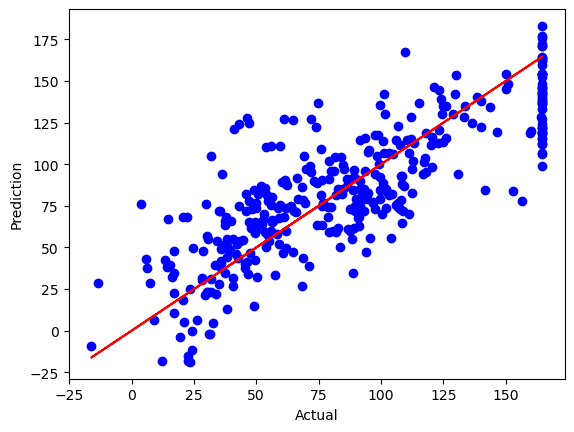

In [121]:
y_pred = model.predict(X_test)
plt.scatter(y_test, y_pred, color='blue')
plt.plot(y_test, y_test, color='red')
plt.xlabel("Actual")
plt.ylabel("Prediction")
df_daily['Datum']=pd.to_datetime(df_daily['Datum'])
df_daily

**b)  Beurteilen Sie die Güte des Modells, indem Sie den mittleren relativen Fehler (mean absolute percentage error, verfügbar in sklearn.metrics) berechnen und auswerten.**
<a id="aufagbe-5b"></a>

In [122]:
from sklearn.metrics import mean_absolute_percentage_error,mean_squared_error,mean_absolute_error
print("Mean absolute percentage error:",mean_absolute_percentage_error(y_test, y_pred))
print("Mean squared error:",mean_squared_error(y_test, y_pred))
print("Mean absolute error:",mean_absolute_error(y_test, y_pred))

Mean absolute percentage error: 0.44734012701009357
Mean squared error: 726.4296871356352
Mean absolute error: 21.057028454058972


**c) Gehen Sie auf mögliche Limitierungen Ihres Modells ein.**
<a id="aufgabe-5c"></a>

### Fazit: 
Unser Modell kann Werte nicht mit mehr als 65 % Genauigkeit vorhersagen, da die zugrunde liegenden Daten nicht zuverlässig genug sind, um zukünftige Werte präzise zu prognostizieren. Dies liegt vor allem daran, dass die Daten von außergewöhnlichen Ereignissen beeinflusst wurden, wie der COVID-19-Pandemie, dem Russland-Ukraine-Krieg und einem einmaligen Softwareproblem am 26. Juni 2024, bei dem der Börsenstrompreis extrem stark angestiegen ist. Solche Faktoren erschweren die Generalisierung der Daten und beeinträchtigen die Stabilität und Genauigkeit der Vorhersagen.

# Aufgabe 6 (Analyse von Stromtarif-Angeboten für Endkunden)

**In dieser Aufgabe sollen Neukunden-Angebotspreise für Endkunden in verschiedenen bayerischen Städten aus dem Jahr 2024 analysiert werden, wie sie beispielsweise auf Preisvergleichsportalen zu finden sind. Es ist pro Tag und Stadt eine JSON-Datei gegeben, in der bis zu 20 Tarifangebote aufgeführt sind, die an diesem Tag in dieser Stadt am günstigsten waren (Sortierung nach `Preis im 1. Jahr`) Die angebotenen Tarife beziehen sich jeweils auf einen jährlichen Gesamtverbrauch von 4000 kWh/Jahr. \
 a) Führen Sie die gegebenen Preisvergleichdaten in einem DataFrame namens `df_cust` zusammen. Exportieren Sie diesen als CSV-Datei namens `prices_customers.csv` und
 laden Sie diese mit Ihrer Abgabe auf Moodle hoch. Verwerfen Sie bitte zur Minimierung der Dateigröße alle Spalten, die im weiteren Verlauf nicht mehr verwendet werden. Kommentieren Sie nun den Code zur Datensatzgenerierung aus und lesen Sie die CSV-Datei in den DataFrame `df_cust` erneut aus dieser Datei ein.**
 <a id="aufgabe-6a"></a>

**Quelle (ChatGPT): https://chatgpt.com/share/679530fb-87f4-800e-9ded-a2c5b0124f38**

In [123]:
'''import os
import glob
import pandas as pd
from datetime import datetime
import json
def process_json_files(input_dir, output_file):
    all_data = []  # List to collect all rows
    for root, dirs, files in os.walk(input_dir):
        for file in files:
            if file.endswith('.json'):
                file_path = os.path.join(root, file)
                with open(file_path, 'r', encoding='utf-8') as f:
                    data = json.load(f)
                    # Extracting date from folder name
                    date = os.path.basename(root)
                    if not date:  # If no date folder, use filename
                        date = file.split('_')[0]
                    # Convert to datetime
                    
                    # Append rows to the list
                    for item in data.values():
                        item['Date'] = date
                        all_data.append(item)
    
    # Convert to DataFrame
    df = pd.DataFrame(all_data)
    
    # Data cleaning and formatting
    
    
    # Save to CSV
    df.to_csv(output_file, index=False, encoding='utf-8')
    print(f"Data successfully saved to {output_file}")

# Example usage
input_directory = "DAT-WS2425-Projektarbeit/DAT-WS2425-Projektarbeit/Daten/Endkundenpreise"  # Replace with the directory path
output_csv = "prices_customers.csv"
process_json_files(input_directory, output_csv)

# Display the resulting DataFrame'''

'import os\nimport glob\nimport pandas as pd\nfrom datetime import datetime\nimport json\ndef process_json_files(input_dir, output_file):\n    all_data = []  # List to collect all rows\n    for root, dirs, files in os.walk(input_dir):\n        for file in files:\n            if file.endswith(\'.json\'):\n                file_path = os.path.join(root, file)\n                with open(file_path, \'r\', encoding=\'utf-8\') as f:\n                    data = json.load(f)\n                    # Extracting date from folder name\n                    date = os.path.basename(root)\n                    if not date:  # If no date folder, use filename\n                        date = file.split(\'_\')[0]\n                    # Convert to datetime\n                    \n                    # Append rows to the list\n                    for item in data.values():\n                        item[\'Date\'] = date\n                        all_data.append(item)\n    \n    # Convert to DataFrame\n    df = pd

In [124]:
df_cust = pd.read_csv('prices_customers.csv', low_memory=False)
df_cust

,Postleitzahl,Jahresverbrauch,Abschlagszahlung,Grundpreis,Arbeitspreis,Preisgarantie,Vertragslaufzeit,Verlängerung,Kündigungsfrist,Preis im 1. Jahr*,Stadt,Anbieter,Tarif,Date,Grundpreisrabatt:,Neukundenbonus,Sofortbonus,Preis im 1. Jahr,Arbeitspreisrabatt,Zusätzlicher Aktionsbonus,Blitzbonus,Abschlagsrabatt,Grundpreisrabatt,Winterprämie
0,80331.0,4.000 kWh,monatlich,"14,40 €/Monat (172,86 €/Jahr)","19,61 Cent/kWh",1 Monat Preisfixierung,1 Monat,1 Monat,1 Monat,"79,77 €/Monat",München,\nENSTROGA AG\nDie Enstroga Aktiengesellschaft...,Tarif Fairpower one,01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,80331.0,4.000 kWh,monatlich,"11,16 €/Monat (133,88 €/Jahr)","22,02 Cent/kWh",1 Monat Nettopreisgarantie,1 Monat,1 Monat,1 Monat,"81,57 €/Monat",München,\nRABOT CHARGE GmbH\nDie RABOT CHARGE GmbH den...,Tarif rabot.home flex,01-02,3 €/Monat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,80331.0,4.000 kWh,monatlich,"13,14 €/Monat (157,62 €/Jahr)","28,59 Cent/kWh",12 Monate Nettopreisgarantie,12 Monate,1 Monat,1 Monat,NaN,München,\nLichtBlick SE\nLichtBlick ist Deutschlands g...,Tarif ÖkoStrom Komfort 12,01-02,NaN,189 € einmalig,111 € einmalig,"83,44 €/Monat",NaN,NaN,NaN,NaN,NaN,NaN
3,80331.0,4.000 kWh,monatlich,"11,16 €/Monat (133,88 €/Jahr)","21,99 Cent/kWh",1 Monat Nettopreisgarantie,1 Monat,2 Wochen,2 Wochen,"84,46 €/Monat",München,\nTibber Deutschland GmbH\nTibber ist ein inno...,Tarif Dynamischer Tarif,01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,80331.0,4.000 kWh,monatlich,"22,51 €/Monat (270,17 €/Jahr)","27,01 Cent/kWh",12 Monate Preisfixierung,12 Monate,1 Monat,1 Monat,NaN,München,\nElektrizitätsversorgung Berlin ElVeBe GmbH\n...,Tarif ELEKTRIZITÄT BERLIN Strom,01-02,NaN,15 % auf Rechnungsbetrag (202 € ),50 € einmalig,"91,51 €/Monat",NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256335,97070.0,4.000 kWh,monatlich,"17,50 €/Monat (210,00 €/Jahr)","27,67 Cent/kWh",12 Monate Preisfixierung,12 Monate,1 Monat,1 Monat zum Monatsende,NaN,Würzburg,\nE WIE EINFACH GmbH\nDie E WIE EINFACH GmbH i...,Tarif Grün & Günstig Strom,12-31,NaN,15 % auf Rechnungsbetrag,72 €,"87,31 €/Monat",NaN,NaN,NaN,NaN,NaN,NaN
256336,97070.0,4.000 kWh,monatlich,"15,90 €/Monat (190,80 €/Jahr)","26,18 Cent/kWh",Preisfixierung bis 30.06.2026,12 Monate,1 Monat,1 Monat,NaN,Würzburg,\nLechwerke AG\nDie LEW-Gruppe ist als regiona...,Tarif LEW Strom Garant Natur,12-31,NaN,170 €,20 €,"87,33 €/Monat",NaN,NaN,NaN,NaN,NaN,NaN
256337,97070.0,4.000 kWh,monatlich,"16,05 €/Monat (192,55 €/Jahr)","24,77 Cent/kWh",12 Monate Nettopreisgarantie,12 Monate,1 Monat,1 Monat,NaN,Würzburg,\nKlickEnergie GmbH & Co. KG\nDer Strom- und G...,Tarif KlickStrom,12-31,NaN,135 €,NaN,"87,38 €/Monat",NaN,NaN,NaN,NaN,NaN,NaN
256338,97070.0,4.000 kWh,monatlich,"14,87 €/Monat (178,38 €/Jahr)","28,59 Cent/kWh",12 Monate Nettopreisgarantie,12 Monate,4 Wochen,4 Wochen,NaN,Würzburg,\nENTEGA Plus GmbH\nDie ENTEGA Plus GmbH mit S...,Tarif ENTEGA Ökostrom eco,12-31,NaN,198 €,75 €,"87,42 €/Monat",NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
print(df_cust.columns.tolist())

['Postleitzahl', 'Jahresverbrauch', 'Abschlagszahlung', 'Grundpreis', 'Arbeitspreis', 'Preisgarantie', 'Vertragslaufzeit', 'Verlängerung', 'Kündigungsfrist', 'Preis im 1. Jahr*', 'Stadt', 'Anbieter', 'Tarif', 'Date', 'Grundpreisrabatt:', 'Neukundenbonus', 'Sofortbonus', 'Preis im 1. Jahr', 'Arbeitspreisrabatt', 'Zusätzlicher Aktionsbonus', 'Blitzbonus', 'Abschlagsrabatt', 'Grundpreisrabatt', 'Winterprämie']


**b) Bereiten Sie die Daten auf die weitere Analyse vor, indem Sie geeignete Datentransformations- und-bereinigungsschritte durchführen.**<a id="aufgabe-6b"></a>

In [126]:
df_cust['Jahresverbrauch'] = pd.to_numeric(df_cust['Jahresverbrauch'].str.extract(r'(\d+\.\d+)')[0].str.replace('.', ''), errors='coerce')
df_cust['Grundpreis'] = pd.to_numeric(df_cust['Grundpreis'].str.extract(r'(\d+\,\d+)')[0].str.replace(',', '.'), errors='coerce')
df_cust['Arbeitspreis'] = pd.to_numeric(df_cust['Arbeitspreis'].str.extract(r'(\d+\,\d+)')[0].str.replace(',', '.'), errors='coerce')
df_cust['Preis im 1. Jahr*'] = pd.to_numeric(df_cust['Preis im 1. Jahr*'].str.extract(r'(\d+\,\d+)')[0].str.replace(',', '.'), errors='coerce')
df_cust['Preis im 1. Jahr'] = pd.to_numeric(df_cust['Preis im 1. Jahr'].str.extract(r'(\d+\,\d+)')[0].str.replace(',', '.'), errors='coerce')
df_cust['Vertragslaufzeit'] = pd.to_numeric(df_cust['Vertragslaufzeit'].str.extract(r'(\d+)')[0], errors='coerce')
df_cust['AnbieterName'] = df_cust['Anbieter'].str.extract(r'\n(.*?)\n')
df_cust['Tarif'] = df_cust['Tarif'].str.extract(r'Tarif\s+(.*)')
df_cust

,Postleitzahl,Jahresverbrauch,Abschlagszahlung,Grundpreis,Arbeitspreis,Preisgarantie,Vertragslaufzeit,Verlängerung,Kündigungsfrist,Preis im 1. Jahr*,Stadt,Anbieter,Tarif,Date,Grundpreisrabatt:,Neukundenbonus,Sofortbonus,Preis im 1. Jahr,Arbeitspreisrabatt,Zusätzlicher Aktionsbonus,Blitzbonus,Abschlagsrabatt,Grundpreisrabatt,Winterprämie,AnbieterName
0,80331.0,4000.0,monatlich,14.40,19.61,1 Monat Preisfixierung,1.0,1 Monat,1 Monat,79.77,München,\nENSTROGA AG\nDie Enstroga Aktiengesellschaft...,Fairpower one,01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSTROGA AG
1,80331.0,4000.0,monatlich,11.16,22.02,1 Monat Nettopreisgarantie,1.0,1 Monat,1 Monat,81.57,München,\nRABOT CHARGE GmbH\nDie RABOT CHARGE GmbH den...,rabot.home flex,01-02,3 €/Monat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RABOT CHARGE GmbH
2,80331.0,4000.0,monatlich,13.14,28.59,12 Monate Nettopreisgarantie,12.0,1 Monat,1 Monat,NaN,München,\nLichtBlick SE\nLichtBlick ist Deutschlands g...,ÖkoStrom Komfort 12,01-02,NaN,189 € einmalig,111 € einmalig,83.44,NaN,NaN,NaN,NaN,NaN,NaN,LichtBlick SE
3,80331.0,4000.0,monatlich,11.16,21.99,1 Monat Nettopreisgarantie,1.0,2 Wochen,2 Wochen,84.46,München,\nTibber Deutschland GmbH\nTibber ist ein inno...,Dynamischer Tarif,01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tibber Deutschland GmbH
4,80331.0,4000.0,monatlich,22.51,27.01,12 Monate Preisfixierung,12.0,1 Monat,1 Monat,NaN,München,\nElektrizitätsversorgung Berlin ElVeBe GmbH\n...,ELEKTRIZITÄT BERLIN Strom,01-02,NaN,15 % auf Rechnungsbetrag (202 € ),50 € einmalig,91.51,NaN,NaN,NaN,NaN,NaN,NaN,Elektrizitätsversorgung Berlin ElVeBe GmbH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256335,97070.0,4000.0,monatlich,17.50,27.67,12 Monate Preisfixierung,12.0,1 Monat,1 Monat zum Monatsende,NaN,Würzburg,\nE WIE EINFACH GmbH\nDie E WIE EINFACH GmbH i...,Grün & Günstig Strom,12-31,NaN,15 % auf Rechnungsbetrag,72 €,87.31,NaN,NaN,NaN,NaN,NaN,NaN,E WIE EINFACH GmbH
256336,97070.0,4000.0,monatlich,15.90,26.18,Preisfixierung bis 30.06.2026,12.0,1 Monat,1 Monat,NaN,Würzburg,\nLechwerke AG\nDie LEW-Gruppe ist als regiona...,LEW Strom Garant Natur,12-31,NaN,170 €,20 €,87.33,NaN,NaN,NaN,NaN,NaN,NaN,Lechwerke AG
256337,97070.0,4000.0,monatlich,16.05,24.77,12 Monate Nettopreisgarantie,12.0,1 Monat,1 Monat,NaN,Würzburg,\nKlickEnergie GmbH & Co. KG\nDer Strom- und G...,KlickStrom,12-31,NaN,135 €,NaN,87.38,NaN,NaN,NaN,NaN,NaN,NaN,KlickEnergie GmbH & Co. KG
256338,97070.0,4000.0,monatlich,14.87,28.59,12 Monate Nettopreisgarantie,12.0,4 Wochen,4 Wochen,NaN,Würzburg,\nENTEGA Plus GmbH\nDie ENTEGA Plus GmbH mit S...,ENTEGA Ökostrom eco,12-31,NaN,198 €,75 €,87.42,NaN,NaN,NaN,NaN,NaN,NaN,ENTEGA Plus GmbH


In [127]:
df_cust['Preis im 1. Jahr'] = df_cust['Preis im 1. Jahr'].fillna(df_cust['Preis im 1. Jahr*'])
df_cust = df_cust.drop(columns=['Preis im 1. Jahr*'])
df_cust

,Postleitzahl,Jahresverbrauch,Abschlagszahlung,Grundpreis,Arbeitspreis,Preisgarantie,Vertragslaufzeit,Verlängerung,Kündigungsfrist,Stadt,Anbieter,Tarif,Date,Grundpreisrabatt:,Neukundenbonus,Sofortbonus,Preis im 1. Jahr,Arbeitspreisrabatt,Zusätzlicher Aktionsbonus,Blitzbonus,Abschlagsrabatt,Grundpreisrabatt,Winterprämie,AnbieterName
0,80331.0,4000.0,monatlich,14.40,19.61,1 Monat Preisfixierung,1.0,1 Monat,1 Monat,München,\nENSTROGA AG\nDie Enstroga Aktiengesellschaft...,Fairpower one,01-02,NaN,NaN,NaN,79.77,NaN,NaN,NaN,NaN,NaN,NaN,ENSTROGA AG
1,80331.0,4000.0,monatlich,11.16,22.02,1 Monat Nettopreisgarantie,1.0,1 Monat,1 Monat,München,\nRABOT CHARGE GmbH\nDie RABOT CHARGE GmbH den...,rabot.home flex,01-02,3 €/Monat,NaN,NaN,81.57,NaN,NaN,NaN,NaN,NaN,NaN,RABOT CHARGE GmbH
2,80331.0,4000.0,monatlich,13.14,28.59,12 Monate Nettopreisgarantie,12.0,1 Monat,1 Monat,München,\nLichtBlick SE\nLichtBlick ist Deutschlands g...,ÖkoStrom Komfort 12,01-02,NaN,189 € einmalig,111 € einmalig,83.44,NaN,NaN,NaN,NaN,NaN,NaN,LichtBlick SE
3,80331.0,4000.0,monatlich,11.16,21.99,1 Monat Nettopreisgarantie,1.0,2 Wochen,2 Wochen,München,\nTibber Deutschland GmbH\nTibber ist ein inno...,Dynamischer Tarif,01-02,NaN,NaN,NaN,84.46,NaN,NaN,NaN,NaN,NaN,NaN,Tibber Deutschland GmbH
4,80331.0,4000.0,monatlich,22.51,27.01,12 Monate Preisfixierung,12.0,1 Monat,1 Monat,München,\nElektrizitätsversorgung Berlin ElVeBe GmbH\n...,ELEKTRIZITÄT BERLIN Strom,01-02,NaN,15 % auf Rechnungsbetrag (202 € ),50 € einmalig,91.51,NaN,NaN,NaN,NaN,NaN,NaN,Elektrizitätsversorgung Berlin ElVeBe GmbH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256335,97070.0,4000.0,monatlich,17.50,27.67,12 Monate Preisfixierung,12.0,1 Monat,1 Monat zum Monatsende,Würzburg,\nE WIE EINFACH GmbH\nDie E WIE EINFACH GmbH i...,Grün & Günstig Strom,12-31,NaN,15 % auf Rechnungsbetrag,72 €,87.31,NaN,NaN,NaN,NaN,NaN,NaN,E WIE EINFACH GmbH
256336,97070.0,4000.0,monatlich,15.90,26.18,Preisfixierung bis 30.06.2026,12.0,1 Monat,1 Monat,Würzburg,\nLechwerke AG\nDie LEW-Gruppe ist als regiona...,LEW Strom Garant Natur,12-31,NaN,170 €,20 €,87.33,NaN,NaN,NaN,NaN,NaN,NaN,Lechwerke AG
256337,97070.0,4000.0,monatlich,16.05,24.77,12 Monate Nettopreisgarantie,12.0,1 Monat,1 Monat,Würzburg,\nKlickEnergie GmbH & Co. KG\nDer Strom- und G...,KlickStrom,12-31,NaN,135 €,NaN,87.38,NaN,NaN,NaN,NaN,NaN,NaN,KlickEnergie GmbH & Co. KG
256338,97070.0,4000.0,monatlich,14.87,28.59,12 Monate Nettopreisgarantie,12.0,4 Wochen,4 Wochen,Würzburg,\nENTEGA Plus GmbH\nDie ENTEGA Plus GmbH mit S...,ENTEGA Ökostrom eco,12-31,NaN,198 €,75 €,87.42,NaN,NaN,NaN,NaN,NaN,NaN,ENTEGA Plus GmbH


**c) Wie viele verschiedene Tarife wurden insgesamt angeboten?**
<a id="aufgabe-6c"></a>

In [128]:
print(len(df_cust['Tarif'].unique()))

111


**Zu wie vielen Tagen sind pro Stadt Daten vorhanden?**

In [129]:
df_cust.groupby('Stadt').count()/20

,Postleitzahl,Jahresverbrauch,Abschlagszahlung,Grundpreis,Arbeitspreis,Preisgarantie,Vertragslaufzeit,Verlängerung,Kündigungsfrist,Anbieter,Tarif,Date,Grundpreisrabatt:,Neukundenbonus,Sofortbonus,Preis im 1. Jahr,Arbeitspreisrabatt,Zusätzlicher Aktionsbonus,Blitzbonus,Abschlagsrabatt,Grundpreisrabatt,Winterprämie,AnbieterName
Stadt,,,,,,,,,,,,,,,,,,,,,,,
Amberg,321.95,321.95,321.95,321.95,321.95,321.95,321.95,321.95,321.95,323.0,323.0,323.0,2.45,234.60,206.65,321.95,26.05,1.50,11.45,2.80,9.50,0.90,323.0
Ansbach,319.05,319.05,319.05,319.05,319.05,319.05,319.05,319.05,319.05,320.0,320.0,320.0,2.25,228.40,192.95,319.05,26.90,0.90,12.80,2.15,8.70,1.10,320.0
Aschaffenburg,319.65,319.65,319.65,319.65,319.65,319.65,319.65,319.65,319.65,320.0,320.0,320.0,0.90,238.60,203.55,319.65,26.40,0.75,12.65,2.00,4.50,1.45,320.0
Augsburg,320.55,320.55,320.55,320.55,320.55,320.55,320.55,320.55,320.55,321.0,321.0,321.0,1.65,233.45,208.40,320.55,24.90,0.70,11.15,1.85,9.50,1.30,321.0
Bamberg,319.15,319.15,319.15,319.15,319.15,319.15,319.15,319.15,319.15,320.0,320.0,320.0,2.25,228.30,198.15,319.15,22.90,0.30,12.25,2.05,4.60,1.30,320.0
Bayreuth,318.75,318.75,318.75,318.75,318.75,318.75,318.75,318.75,318.75,320.0,320.0,320.0,2.90,229.25,201.85,318.75,30.00,0.60,11.55,1.85,10.55,0.85,320.0
Beilngries,320.60,320.60,320.60,320.60,320.60,320.60,320.60,320.60,320.60,321.0,321.0,321.0,2.50,230.75,199.85,320.60,19.55,0.70,10.55,2.95,5.95,1.85,321.0
Burglengenfeld,320.35,320.35,320.35,320.35,320.35,320.35,320.35,320.35,320.35,321.0,321.0,321.0,3.10,234.10,204.10,320.35,20.05,0.65,9.45,2.75,6.20,1.75,321.0
Cham,317.70,317.70,317.70,317.70,317.70,317.70,317.70,317.70,317.70,318.0,318.0,318.0,3.10,222.45,192.10,317.70,30.05,0.65,14.40,6.65,0.85,2.40,318.0


**Wie viele verschiedene Anbieter haben insgesamt Tarife angeboten?**

In [130]:
print(len(df_cust['AnbieterName'].unique()))

64


**d)  Ermitteln Sie, welche unterschiedlichen Tarife in Amberg angeboten wurden**
<a id="aufgabe-6d"></a>

In [131]:
amberg_tarif=pd.Series(df_cust[df_cust['Stadt']=='Amberg']['Tarif'].unique(), name='Tarif')
amberg_tarif

0                                Fairpower one
1                            Dynamischer Tarif
2                          ÖkoStrom Komfort 12
3                              rabot.home flex
4                    ELEKTRIZITÄT BERLIN Strom
5                         Grün & Günstig Strom
6                              Strom SmartLine
7                                Strom Easy 12
8                               Strom Bonus 12
9                            Ostrom SimplyFair
10                              E.ON Strom Öko
11                   R(H)EINPOWER MeinStrom 12
12                   goldgas natürlich12 Strom
13                                 M-Strom Fix
14                          Lidl-ÖkoStrom Plus
15                               Naturstrom 12
16                      eprimoStrom PrimaKlima
17                  stromhoch3 aus Wasserkraft
18    strom³ aus Wasserkraft mit Preisgarantie
19                              Q.ENERGY Eco12
20                    Spar Smart Premium Extra
21           

In [132]:
df_cust['Date'] = '2024-'+df_cust['Date']


In [133]:
df_cust['Date'] = pd.to_datetime(df_cust['Date'])

In [134]:
df_cust

,Postleitzahl,Jahresverbrauch,Abschlagszahlung,Grundpreis,Arbeitspreis,Preisgarantie,Vertragslaufzeit,Verlängerung,Kündigungsfrist,Stadt,Anbieter,Tarif,Date,Grundpreisrabatt:,Neukundenbonus,Sofortbonus,Preis im 1. Jahr,Arbeitspreisrabatt,Zusätzlicher Aktionsbonus,Blitzbonus,Abschlagsrabatt,Grundpreisrabatt,Winterprämie,AnbieterName
0,80331.0,4000.0,monatlich,14.40,19.61,1 Monat Preisfixierung,1.0,1 Monat,1 Monat,München,\nENSTROGA AG\nDie Enstroga Aktiengesellschaft...,Fairpower one,2024-01-02,NaN,NaN,NaN,79.77,NaN,NaN,NaN,NaN,NaN,NaN,ENSTROGA AG
1,80331.0,4000.0,monatlich,11.16,22.02,1 Monat Nettopreisgarantie,1.0,1 Monat,1 Monat,München,\nRABOT CHARGE GmbH\nDie RABOT CHARGE GmbH den...,rabot.home flex,2024-01-02,3 €/Monat,NaN,NaN,81.57,NaN,NaN,NaN,NaN,NaN,NaN,RABOT CHARGE GmbH
2,80331.0,4000.0,monatlich,13.14,28.59,12 Monate Nettopreisgarantie,12.0,1 Monat,1 Monat,München,\nLichtBlick SE\nLichtBlick ist Deutschlands g...,ÖkoStrom Komfort 12,2024-01-02,NaN,189 € einmalig,111 € einmalig,83.44,NaN,NaN,NaN,NaN,NaN,NaN,LichtBlick SE
3,80331.0,4000.0,monatlich,11.16,21.99,1 Monat Nettopreisgarantie,1.0,2 Wochen,2 Wochen,München,\nTibber Deutschland GmbH\nTibber ist ein inno...,Dynamischer Tarif,2024-01-02,NaN,NaN,NaN,84.46,NaN,NaN,NaN,NaN,NaN,NaN,Tibber Deutschland GmbH
4,80331.0,4000.0,monatlich,22.51,27.01,12 Monate Preisfixierung,12.0,1 Monat,1 Monat,München,\nElektrizitätsversorgung Berlin ElVeBe GmbH\n...,ELEKTRIZITÄT BERLIN Strom,2024-01-02,NaN,15 % auf Rechnungsbetrag (202 € ),50 € einmalig,91.51,NaN,NaN,NaN,NaN,NaN,NaN,Elektrizitätsversorgung Berlin ElVeBe GmbH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256335,97070.0,4000.0,monatlich,17.50,27.67,12 Monate Preisfixierung,12.0,1 Monat,1 Monat zum Monatsende,Würzburg,\nE WIE EINFACH GmbH\nDie E WIE EINFACH GmbH i...,Grün & Günstig Strom,2024-12-31,NaN,15 % auf Rechnungsbetrag,72 €,87.31,NaN,NaN,NaN,NaN,NaN,NaN,E WIE EINFACH GmbH
256336,97070.0,4000.0,monatlich,15.90,26.18,Preisfixierung bis 30.06.2026,12.0,1 Monat,1 Monat,Würzburg,\nLechwerke AG\nDie LEW-Gruppe ist als regiona...,LEW Strom Garant Natur,2024-12-31,NaN,170 €,20 €,87.33,NaN,NaN,NaN,NaN,NaN,NaN,Lechwerke AG
256337,97070.0,4000.0,monatlich,16.05,24.77,12 Monate Nettopreisgarantie,12.0,1 Monat,1 Monat,Würzburg,\nKlickEnergie GmbH & Co. KG\nDer Strom- und G...,KlickStrom,2024-12-31,NaN,135 €,NaN,87.38,NaN,NaN,NaN,NaN,NaN,NaN,KlickEnergie GmbH & Co. KG
256338,97070.0,4000.0,monatlich,14.87,28.59,12 Monate Nettopreisgarantie,12.0,4 Wochen,4 Wochen,Würzburg,\nENTEGA Plus GmbH\nDie ENTEGA Plus GmbH mit S...,ENTEGA Ökostrom eco,2024-12-31,NaN,198 €,75 €,87.42,NaN,NaN,NaN,NaN,NaN,NaN,ENTEGA Plus GmbH


**visualisieren Sie exemplarisch für die Stadt Amberg den Füllgrad der Daten. Erstellen Sie dazu eine HeatMap, aus der hervorgeht, an welchen Tagen es zu welchen der ermittelten Tarife Angebotsdaten gab.**

In [135]:
import plotly.graph_objects as go
df_cust_amberg = df_cust[df_cust['Stadt']=='Amberg'][['Tarif', 'Date']].value_counts().reset_index()
fig = go.Figure(data=go.Heatmap(z=df_cust_amberg['count'], x=df_cust_amberg['Tarif'], y= df_cust_amberg['Date'], colorscale='Viridis', zmin=0, zmax=2))
fig.update_layout(width=1500, height = 1000)
fig.show()
df_cust_amberg

,Tarif,Date,count
0,LEW Strom Fix Natur,2024-07-13,2
1,LEW Strom Fix Natur,2024-07-14,2
2,LEW Strom Fix Natur,2024-07-15,2
3,123strom,2024-01-25,1
4,Strom Bonus 12,2024-05-14,1
...,...,...,...
6452,LEW Strom Fix Natur,2024-09-01,1
6453,LEW Strom Fix Natur,2024-08-31,1
6454,LEW Strom Fix Natur,2024-08-30,1
6455,LEW Strom Fix Natur,2024-08-29,1


**e) Visualisieren Sie die durchschnittliche Preisentwicklung im Verlauf des Jahres 2024 über alle Tarife und Orte hinweg. Berücksichtigen Sie dabei nur Tarife, bei denen die Vertrags laufzeit mindestens 12 Monate beträgt. Verwenden Sie dazu den Preis im 1. Jahr, der den monatlichen Preis unter Berücksichtigung des Grundpreises, des Arbeitspreises und von Bonuszahlungen o. ä. enthält. Untersuchen Sie anschließend den Zusammenhang zum Börsenstrompreis, indem Sie geeignete Kenngrößen berechnen und weitere Diagramme erstellen.**
<a id="aufgabe-6e"></a>

(60.0, 100.0)

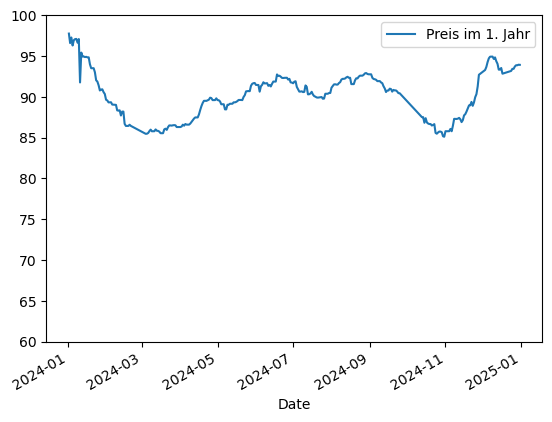

In [136]:
df_avg=df_cust[df_cust['Vertragslaufzeit']>=12].groupby(['Date'])['Preis im 1. Jahr'].mean().reset_index()

df_avg.plot(x='Date', y='Preis im 1. Jahr', kind='line').set_ylim([60,100])

In [137]:
df_avg = df_avg.rename(columns={'Date': 'Datum'})

In [138]:
df_daily = pd.read_csv('daily.csv')
df_daily = df_daily[pd.DatetimeIndex(df_daily['Datum']).year == 2024]
aufgabe_6e = df_daily[['Day Ahead Auktion Preis (EUR/MWh)', 'Datum']].copy()
aufgabe_6e['Datum'] = pd.to_datetime(aufgabe_6e['Datum'])
df_avg['Datum'] = pd.to_datetime(df_avg['Datum'])
aufgabe_6e = aufgabe_6e.merge(df_avg, on='Datum',how='left')


(0.0, 600.0)

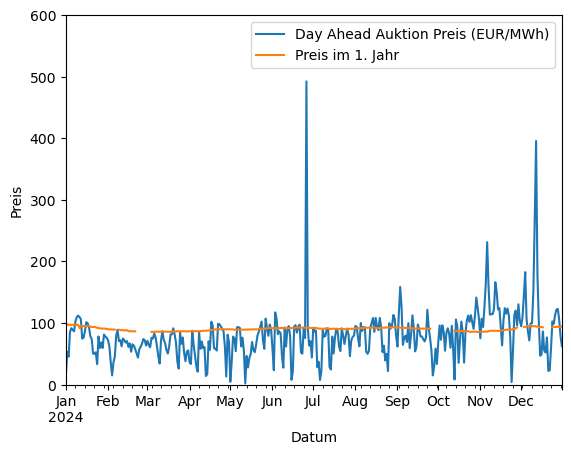

In [139]:
aufgabe_6e.plot(x='Datum', y=['Day Ahead Auktion Preis (EUR/MWh)', 'Preis im 1. Jahr'], kind='line', ylabel='Preis').set_ylim([0,600])

In [140]:
correlation_analyse = aufgabe_6e.drop(columns=['Datum']).corr()
display(correlation_analyse)
fig2 = go.Figure(data=go.Heatmap(z=correlation_analyse.values, x=correlation_analyse.columns, y= correlation_analyse.columns, colorscale='Viridis'))
fig2.update_layout(width=750, height=500)
fig2.show()

,Day Ahead Auktion Preis (EUR/MWh),Preis im 1. Jahr
Day Ahead Auktion Preis (EUR/MWh),1.000000,0.143278
Preis im 1. Jahr,0.143278,1.000000


**f) Erstellen Sie ein interaktives Liniendiagramm in Plotly, um die zeitliche Entwicklung der Angebotspreise pro Stadt zu visualisieren. Das Diagramm soll eine Dropdown-Liste enthalten, über die man die Stadt auswählen kann. Das Diagramm soll die Preisentwicklung für diejenigen zehn Tarife zeigen, die in der jeweiligen Stadt im Verlauf des Jahres am häufigsten angeboten wurden (die sich also am häufigsten unter den günstigsten 20 Tarifen beim Preisvergleich befanden). Durch Klick auf den Namen des Tarifs in der Legende soll es möglich sein, dessen Kurve im Diagramm ein- und auszublenden.** <br>
**Quelle(ChatGPT): https://chatgpt.com/share/679533ba-443c-800e-add0-e674b959bb8c**
<a id="aufgabe-6f"></a>

In [141]:
'''top10=df_cust[df_cust['Stadt']=='München'][['Stadt','Tarif', 'Preis im 1. Jahr']]
top10tarif = top10.groupby(['Tarif'])['Preis im 1. Jahr'].count().sort_values(ascending=False).head(10).reset_index()
for tarif in top10tarif['Tarif']:
    print(tarif)'''
df_city = df_cust[df_cust['Stadt'] == 'Amberg']

# 4) Determine top 10 Tarife by frequency
    #    (how many rows exist for each tarif)
tarif_counts = df_city[['Tarif', 'AnbieterName']].value_counts().head(10).reset_index()
tarif_counts

,Tarif,AnbieterName,count
0,Dynamischer Tarif,Tibber Deutschland GmbH,320
1,Fairpower X,ENSTROGA AG,306
2,rabot.home flex,RABOT CHARGE GmbH,302
3,Strom Bonus 12,Grünwelt Wärmestrom GmbH,292
4,LEW Strom Fix Natur,Lechwerke AG,264
5,ELEKTRIZITÄT BERLIN Strom,Elektrizitätsversorgung Berlin ElVeBe GmbH,237
6,NEWfair Strom 12,NEW Niederrhein Energie und Wasser GmbH,234
7,eprimoStrom PrimaKlima,eprimo GmbH,220
8,Strom SmartLine,Süwag Vertrieb AG & Co. KG,198
9,SimplyGreen dynamisch,SimplyGreen - Eine Marke der Energy Market Sol...,192


In [142]:
import plotly.graph_objects as go  # Ensure this is imported

fig = go.Figure()

# 2) Get list of unique cities
staedte = df_cust['Stadt'].unique()
num_cities = len(staedte)

# We'll have 10 lines (traces) per city.
# So total number of traces = 10 * num_cities.
# Keep track of each trace’s position in the order we add them.
#

for stadt in staedte:
    # 3) Subset for this city
    df_city = df_cust[df_cust['Stadt'] == stadt]

    # 4) Determine top 10 Tarife by frequency
    #    (how many rows exist for each tarif)
    tarif_counts = df_city['Tarif'].value_counts().head(10)
    top10_tarife = tarif_counts.index.tolist()

    # 5) Add a trace (line) for each of these 10 Tarife
    for tarif in top10_tarife:
        df_city_tarif = df_city[df_city['Tarif'] == tarif]

        fig.add_trace(
            go.Scatter(
                x=df_city_tarif['Date'],
                y=df_city_tarif['Preis im 1. Jahr'],
                mode='lines',
                name=f"{stadt} - {tarif}",
                # Make only the first city visible by default, for demonstration.
                # You can set True/False as you like (e.g. all True).
                #visible=(i == 0)
            )
        )
        
total_traces = 10 * len(staedte)
buttons = []

for i, stadt in enumerate(staedte):
    # Make a mask: only the 10 lines for city i -> True, else False
    visible_array = [False] * total_traces
    start_idx = i * 10
    end_idx = start_idx + 10

    for j in range(start_idx, end_idx):
        visible_array[j] = True

    # Create one button entry for city i
    buttons.append(
        dict(
            label=stadt,
            method="update",
            args=[{"visible": visible_array}]
        )
    )

# Add a button to show ALL lines (all cities)
buttons.append(
    dict(
        label="All",
        method="update",
        args=[{"visible": [True] * total_traces}]
    )
)

# --- Final layout updates ---
fig.update_layout(
    title="Top 10 Tarife pro Stadt (tägliche Preisentwicklung im 1. Jahr, 2024)",
    xaxis_title="Datum",
    yaxis_title="Preis im 1. Jahr",
    updatemenus=[{
        "type": "dropdown",
        "showactive": True,
        "buttons": buttons,
    }]
)

fig.show()    

**g) Untersuchen Sie mit Hilfe des Diagramms die Preisentwicklung der verschiedenen Anbieter in Amberg. Welche Empfehlungen leiten Sie für den Abschluss eines neuen Vertrags ab?**
<a id="aufgabe-6g"></a>

In [143]:
amberg_anbieter = df_cust[['AnbieterName', 'Preis im 1. Jahr', 'Tarif', 'Date']][df_cust['Stadt']=='Amberg'].reset_index()
amberg_anbieter = amberg_anbieter.dropna()
amberg_anbieter
top10_amberg_anbieter =df_cust[['AnbieterName', 'Preis im 1. Jahr', 'Tarif']][df_cust['Stadt']=='Amberg'].value_counts().head(10).reset_index()
top10_amberg_anbieter

,AnbieterName,Preis im 1. Jahr,Tarif,count
0,Aplus Energy GmbH,88.91,Ostrom SimplyFair,124
1,Tibber Deutschland GmbH,80.23,Dynamischer Tarif,92
2,PLAN-B NET ZERO ENERGY GmbH,88.79,PBNZE DYNAMIC PRIVATE,72
3,ENSTROGA AG,77.79,Fairpower X,65
4,Süwag Vertrieb AG & Co. KG,88.75,Strom SmartLine,56
5,SimplyGreen - Eine Marke der Energy Market Sol...,83.66,SimplyGreen dynamisch,55
6,ENSTROGA AG,84.46,Fairpower X,50
7,KlickEnergie GmbH & Co. KG,86.99,KlickStrom,49
8,LichtBlick SE,88.18,ÖkoStrom Komfort 12,49
9,PLAN-B NET ZERO ENERGY GmbH,80.68,PBNZE DYNAMIC PRIVATE,46


In [144]:

fig2 = go.Figure()
for anbieter in top10_amberg_anbieter['AnbieterName']:
    amberg_anbieter_df = amberg_anbieter[amberg_anbieter['AnbieterName'] == anbieter]
    fig2.add_trace(
        go.Scatter(
            x=amberg_anbieter_df['Date'],
            y=amberg_anbieter_df['Preis im 1. Jahr'],
            mode='lines',
            name=anbieter,
        )
    )
fig2.show()

### EMPFEHLUNGEN
- Tibber Deutschland GmbH
- ENSTROGA AG <br>
**da diese beiden Anbieter das ganze Jahr über relativ stabile Preise anbieten.**

**h) Untersuchen Sie die durchschnittlichen Preisniveaus pro Stadt und visualisieren Sie diese auf einer Karte in Folium. Lassen sich bestimmte Trends und Einflussfaktoren erkennen?
<br>
Quelle (Breitengrad und Höhengrad der Städte) : https://www.tutorialspoint.com/how-to-get-the-longitude-and-latitude-of-a-city-using-python**
<a id="aufgabe-6h"></a>

In [145]:
from geopy.geocoders import Nominatim

In [146]:
'''lat = []
long = []
geolocator = Nominatim(user_agent="MyApp")
for stadt in staedte:
    location = geolocator.geocode(stadt)
    lat.append(location.latitude)
    long.append(location.longitude)
print(lat)
print("---------------------")
print(len(long))'''

'lat = []\nlong = []\ngeolocator = Nominatim(user_agent="MyApp")\nfor stadt in staedte:\n    location = geolocator.geocode(stadt)\n    lat.append(location.latitude)\n    long.append(location.longitude)\nprint(lat)\nprint("---------------------")\nprint(len(long))'

In [147]:
'''dict={'Stadt':staedte,'Latitude':lat, 'Longitude':long}
coordinates = pd.DataFrame(dict)
coordinates.to_csv('coordinates.csv', index=False)'''
#coordinates

"dict={'Stadt':staedte,'Latitude':lat, 'Longitude':long}\ncoordinates = pd.DataFrame(dict)\ncoordinates.to_csv('coordinates.csv', index=False)"

In [148]:
coordinates= pd.read_csv('coordinates.csv', index_col=False)
coordinates

,Stadt,Latitude,Longitude
0,München,48.137108,11.575382
1,Rosenheim,47.853927,12.127262
2,Landshut,48.536217,12.151655
3,Augsburg,48.369034,10.897952
4,Neu-Ulm,48.395349,10.000521
5,Nürnberg,49.453872,11.077298
6,Amberg,49.454366,11.847402
7,Sulzbach-Rosenberg,49.499247,11.747026
8,Neumarkt,46.316916,11.272570
9,Parsberg,49.159879,11.718766


In [149]:
heatmap_df = df_cust.groupby(['Stadt'])['Preis im 1. Jahr'].mean().reset_index()
heatmap_df

,Stadt,Preis im 1. Jahr
0,Amberg,84.848169
1,Ansbach,84.223194
2,Aschaffenburg,80.848866
3,Augsburg,85.001078
4,Bamberg,86.388321
5,Bayreuth,84.342773
6,Beilngries,89.821514
7,Burglengenfeld,90.174422
8,Cham,88.608758
9,Coburg,88.265643


In [150]:
heatmap_df = heatmap_df.merge(coordinates, on=['Stadt'], how='left')
heatmap_df.loc[heatmap_df["Stadt"]=="Weiden", "Latitude"] = 49.67682
heatmap_df.loc[heatmap_df["Stadt"]=="Weiden", "Longitude"] = 12.15613
heatmap_df.loc[heatmap_df["Stadt"]=="Neumarkt", "Latitude"] = 49.2773
heatmap_df.loc[heatmap_df["Stadt"]=="Neumarkt", "Longitude"] = 11.4672
heatmap_df.loc[heatmap_df["Stadt"]=="Neustadt", "Latitude"] = 48.8030
heatmap_df.loc[heatmap_df["Stadt"]=="Neustadt", "Longitude"] = 11.7671
heatmap_df

,Stadt,Preis im 1. Jahr,Latitude,Longitude
0,Amberg,84.848169,49.454366,11.847402
1,Ansbach,84.223194,49.288874,10.559769
2,Aschaffenburg,80.848866,49.970670,9.138486
3,Augsburg,85.001078,48.369034,10.897952
4,Bamberg,86.388321,49.891604,10.886848
5,Bayreuth,84.342773,49.942720,11.576308
6,Beilngries,89.821514,49.035160,11.473829
7,Burglengenfeld,90.174422,49.207108,12.039960
8,Cham,88.608758,49.217819,12.666383
9,Coburg,88.265643,50.258223,10.964561


In [151]:
import folium.plugins

m = folium.Map(location=[48.1319, 11.5709],
    zoom_start=12, control_scale=True)

marker_cluster = folium.plugins.MarkerCluster().add_to(m)

#Marker fuer die Stations hinzufuegen
for i in range(len(heatmap_df)):
    folium.Marker(list(heatmap_df[['Latitude','Longitude']].iloc[i]), popup=heatmap_df['Preis im 1. Jahr'][i]).add_to(marker_cluster)

#Heatmap anhand der Spalte 'checkout_frac' zeichnen
folium.plugins.HeatMap(heatmap_df[['Latitude','Longitude','Preis im 1. Jahr']].values, radius = 50).add_to(m) 

m

**i) Im Merkmal Anbieter befinden sich kurze Beschreibungen der Anbieter und der Tarife. Erstellen Sie mit Hilfe des Pakets WordCloud eine Wortwolke für die Anbieter Beschreibungen und untersuchen Sie, welche Schlagworte besonders häufig auftreten.**<a id="aufgabe-6i"></a><br>
**Quelle :**
- https://www.python-lernen.de/wordcloud-erstellen-python.htm
- https://www.geeksforgeeks.org/removing-stop-words-nltk-python/

 Die Enstroga Aktiengesellschaft (AG) ist ein vergleichsweise junger Energieanbieter mit Sitz in Berlin. Seit Dezember 2012 bietet Enstroga Strom- und Gastarife an. Enstroga gehört dabei zu keinem großen Energiekonzern, sondern ist vollkommen unabhängig. Entstroga ist aus einer Kooperation zwischen Investoren aus Deutschland und Skandinavien entstanden. Die Enstroga-Partner und Anteilseigner verfügen über langjährige Erfahrung im Strommarkt und im Bereich erneuerbare Energien. Zudem kann Enstroga dank einer Kombination aus modernster Technik und erfahrenen Dienstleistern die bestmöglichste Kundenbetreuung bei gleichzeitig geringen Kosten bieten. Enstroga legt großen Wert auf wirtschaftliche, ökologische und soziale Nachhaltigkeit in der Stromversorgung sowie auf eine langfristige und faire Beziehung zu den eigenen Kunden.
  Die RABOT CHARGE GmbH denkt Stromtarife neu: Das Start-Up bezieht seinen zertifizierten Ökostrom tagesaktuell und gibt den Einkaufspreis so direkt an seine Kunden w

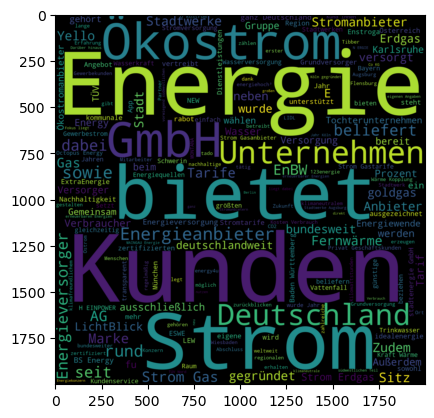

In [152]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords

#nltk.download('stopwords')
stop_words = set(stopwords.words('german'))
df_anbieter = pd.DataFrame({"Anbieter" :df_cust['Anbieter'].unique() })
AnbieterBeschreibung  = df_anbieter['Anbieter'].str.replace(r"\n(.*)\n",' ', regex=True)
#display(AnbieterBeschreibung)
text = ' '.join(AnbieterBeschreibung)

filtered_text = [word for word in text.split() if word.lower() not in stop_words]
final_text = " ".join(filtered_text)
print(text)
# Generate a word cloud image
wordcloud = WordCloud(width=2000,height=2000).generate(final_text)

plt.imshow(wordcloud ,interpolation="bilinear")
plt.show()

### Abschließende Zusammenfassung der Analyseergebnisse und gewonnenen Erkenntnisse:

**Verteilung der Börsenstrompreise:**

Die monatlichen durchschnittlichen Börsenstrompreise zwischen 2020 und 2025 zeigen eine hohe Volatilität, bedingt durch globale Marktstörungen, Abhängigkeit von fossilen Brennstoffen und Ungleichgewichte zwischen Angebot und Nachfrage.
Wichtige Ausreißer:
- 02 Juli 2023: Überproduktion von erneuerbaren Energien führte zu extrem niedrigen Preisen.
- 26 Juni 2024: Eine Marktkopplungsstörung verursachte eine historische Preisexplosion.
- 12 Dezember 2024: Eine sogenannte „Dunkelflaute“ führte zu außergewöhnlich hohen Preisen.

**Erneuerbare vs. Nicht-Erneuerbare Energien:**

Ein Vergleich der erzeugten erneuerbaren und nicht-erneuerbaren Energien zeigt eine zunehmende Abhängigkeit von erneuerbaren Energien.
Saisonale und regionale Schwankungen beeinflussen das Verhältnis zwischen erneuerbaren und nicht-erneuerbaren Energien.

**Zeitreihen- und Korrelationsanalyse:**

Die Korrelationsheatmap zeigt:
Starke positive Korrelationen zwischen Gas- und Kohlepreisen sowie deren Einfluss auf den Day-Ahead-Auktionspreis.
Starke negative Korrelationen zwischen:
Leistung erneuerbarer und nicht-erneuerbarer Energien.
Day-Ahead-Auktionspreisen und der Leistung erneuerbarer Energien.
Temperatur und Leistung nicht-erneuerbarer Energien.

**Lineares Regressionsmodell :**

Ein lineares Regressionsmodell wurde implementiert:
Mit One-Hot-Encoding und der Ersetzung fehlender Werte durch Monatsmittelwerte.
Ausreißer wurden begrenzt, was zu einem Modell-Score von 65% und einem MAPE von 44% führte.

**Stromanbieter in Bayern und Empfehlungen :**

Analyse von Stromanbietern in Bayern, mit besonderem Fokus auf Amberg, zeigt deutliche Preisunterschiede und Variationen bei angebotenen Tarifen.

**Tarif Empfehlung für Amberg:** <br>
Tibber Deutschland GmbH und Enstroga AG, da sie eine stabilere Preisentwicklung aufweisen als andere Anbieter.

**Heatmap und Schlagworte :**

Die Heatmap verdeutlicht Unterschiede in den durchschnittlichen Strompreisen (erstes Jahr) zwischen verschiedenen Städten.
Häufig genannte Schlagworte in Anbieterbeschreibungen unterstreichen Trends und Marktstrategien.

**Fazit:**
Die Analyse zeigt, wie globale Marktstörungen, erneuerbare Energien und fossile Brennstoffe die Strompreise beeinflussen. Gleichzeitig betont sie die Bedeutung stabiler Anbieter und innovativer Energiequellen für zukünftige Preisentwicklungen und Nachhaltigkeit.